#Part one: Intro to SDE's

In [225]:
using DifferentialEquations
α=1
β=1
u₀=0.1
f(u,p,t) = α*u
g(u,p,t) = β
dt = 1//2^(6)
tspan = (0.0,1.0)
prob = SDEProblem(f,g,u₀,(0.0,1.0))

SDEProblem with uType Float64 and tType Float64. In-place: false
timespan: (0.0, 1.0)
u0: 0.1

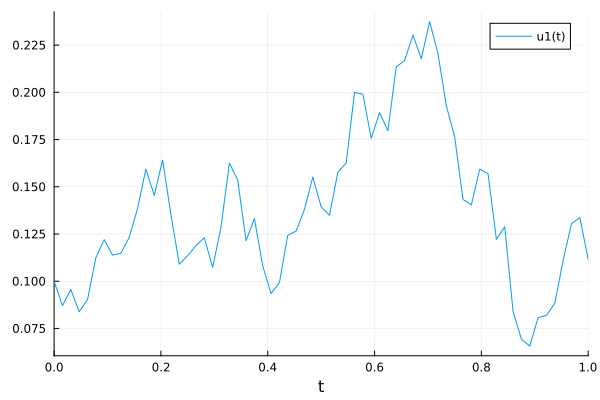

In [156]:
sol = solve(prob,EM(),dt=dt)
using Plots
plot(sol)

In [201]:
sol = solve(prob,EM(),dt=0.0001*dt)
using Plots
plot(sol)

In [165]:
f_analytic(u₀,p,t,W) = u₀*exp((α-(β^2)/2)*t+β*W)
ff = SDEFunction(f,g,analytic=f_analytic)
prob = SDEProblem(ff,g,u₀,(0.0,1.0))

SDEProblem with uType Float64 and tType Float64. In-place: false
timespan: (0.0, 1.0)
u0: 0.1

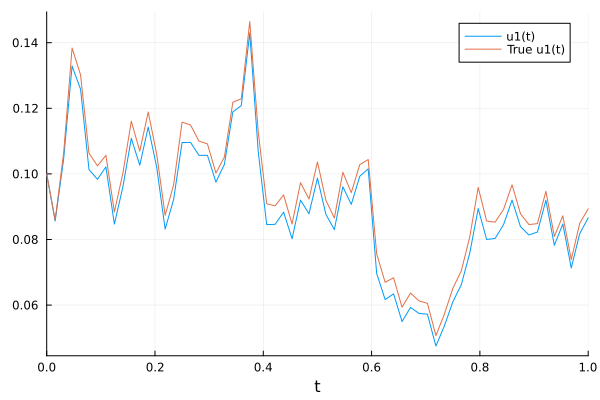

In [176]:
#We can plot using the classic Euler-Maruyama algorithm as follows:
sol = solve(prob,EM(),dt=1*dt)
plot(sol,plot_analytic=true)

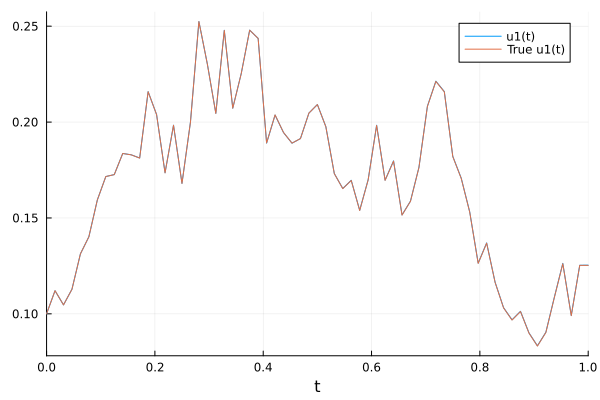

In [179]:
sol = solve(prob,SRIW1(),dt=dt,adaptive=false)
plot(sol,plot_analytic=true)

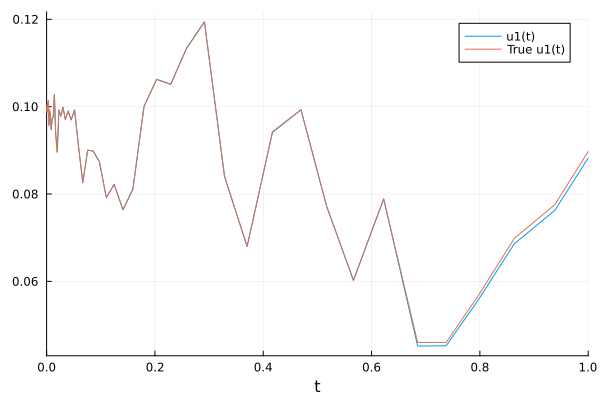

In [189]:
sol = solve(prob,SRIW1())
plot(sol,plot_analytic=true)

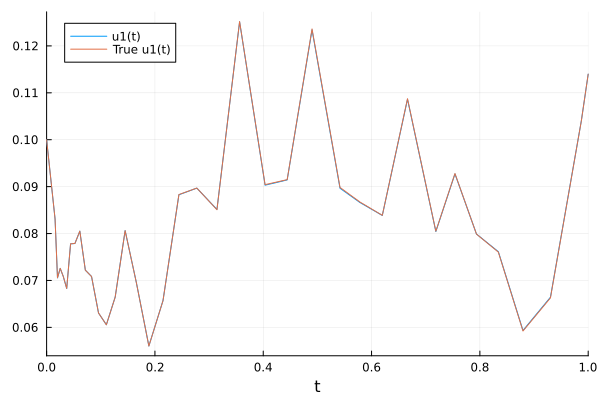

In [195]:
sol = solve(prob,SRIW1(),dt=1*dt)
plot(sol,plot_analytic=true)

In [202]:
ensembleprob = EnsembleProblem(prob)

EnsembleProblem with problem SDEProblem

In [228]:
sol = solve(ensembleprob,EnsembleThreads(),trajectories=1000, dt=0.1*dt)

EnsembleSolution Solution of length 1000 with uType:
RODESolution{Float64, 1, Vector{Float64}, Vector{Float64}, Dict{Symbol, Float64}, Vector{Float64}, NoiseProcess{Float64, 1, Float64, Float64, Float64, Vector{Float64}, typeof(DiffEqNoiseProcess.WHITE_NOISE_DIST), typeof(DiffEqNoiseProcess.WHITE_NOISE_BRIDGE), false, ResettableStacks.ResettableStack{Tuple{Float64, Float64, Float64}, false}, ResettableStacks.ResettableStack{Tuple{Float64, Float64, Float64}, false}, RSWM{Float64}, Nothing, RandomNumbers.Xorshifts.Xoroshiro128Plus}, SDEProblem{Float64, Tuple{Float64, Float64}, false, SciMLBase.NullParameters, Nothing, SDEFunction{false, SciMLBase.FullSpecialize, typeof(f), typeof(g), LinearAlgebra.UniformScaling{Bool}, typeof(f_analytic), Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, typeof(SciMLBase.DEFAULT_OBSERVED), Nothing, Nothing}, typeof(g), Base.Pairs{Symbol, Union{}, Tuple{}, NamedTuple{(), Tuple{}}}, Nothing

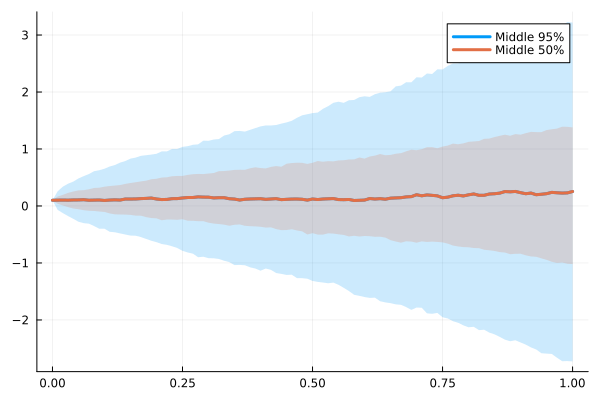

In [229]:
using DifferentialEquations.EnsembleAnalysis
summ = EnsembleSummary(sol,0:0.01:1)
plot(summ,labels="Middle 95%")
summ = EnsembleSummary(sol,0:0.01:1;quantiles=[0.25,0.75])
plot!(summ,labels="Middle 50%",legend=true)

In [230]:
timepoint_meancor(sol,0.2,0.7)

(0.12842901087701325, 0.1884750528691474, 0.6230725523071381)

In [231]:
#Part 2: Systems of SDE's with Diagonal Noise

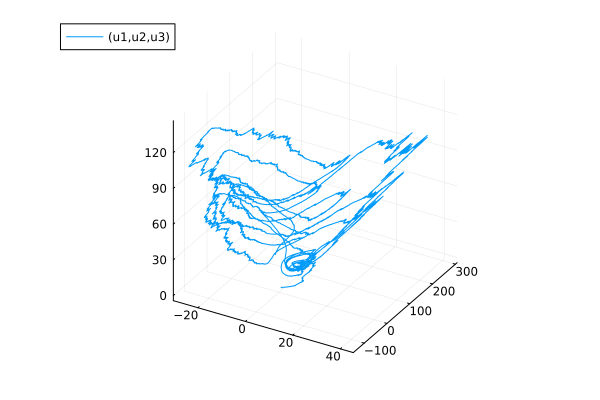

In [249]:
using DifferentialEquations
using Plots
function lorenz(du,u,p,t)
  du[1] = 10.0(u[2]-u[1])
  du[2] = u[1]*(28.0-u[3]) - u[2]
  du[3] = u[1]*u[2] - (8/3)*u[3]
end

function σ_lorenz(du,u,p,t)
  du[1] = 0.1*sin(u[3])*3.0
  du[2] = 0.1*u[2]*u[1]*3.0
  du[3] = 0.1*3.0
end

prob_sde_lorenz = SDEProblem(lorenz,σ_lorenz,[1.0,0.0,0.0],(0.0,10.0))
sol = solve(prob_sde_lorenz)
plot(sol,idxs=(1,2,3))

In [250]:
#Systems of SDE's with Scalar Noise

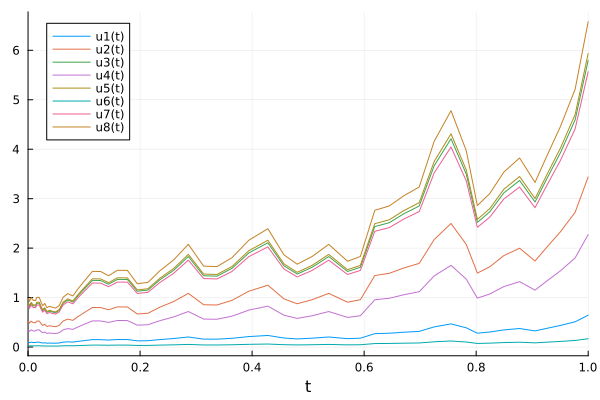

In [251]:
using DifferentialEquations
using Plots
f(du,u,p,t) = (du .= u)
g(du,u,p,t) = (du .= u)
u0 = rand(4,2)

W = WienerProcess(0.0,0.0,0.0)
prob = SDEProblem(f,g,u0,(0.0,1.0),noise=W)
sol = solve(prob,SRIW1())
plot(sol)

In [252]:
#Systems of SDE's with Non-Diagonal Noise

In [277]:
using DifferentialEquations
f(du,u,p,t) = du .= 1.01u
function g(du,u,p,t)
  du[1,1] = 0.3u[1]
  du[1,2] = 0.6u[1]
  du[1,3] = 0.9u[1]
  du[1,4] = 0.12u[1]
  du[2,1] = 1.2u[2]
  du[2,2] = 0.2u[2]
  du[2,3] = 0.3u[2]
  du[2,4] = 1.8u[2]
end
prob = SDEProblem(f,g,ones(2),(0.0,1.0),noise_rate_prototype=zeros(2,4))

SDEProblem with uType Vector{Float64} and tType Float64. In-place: true
timespan: (0.0, 1.0)
u0: 2-element Vector{Float64}:
 1.0
 1.0

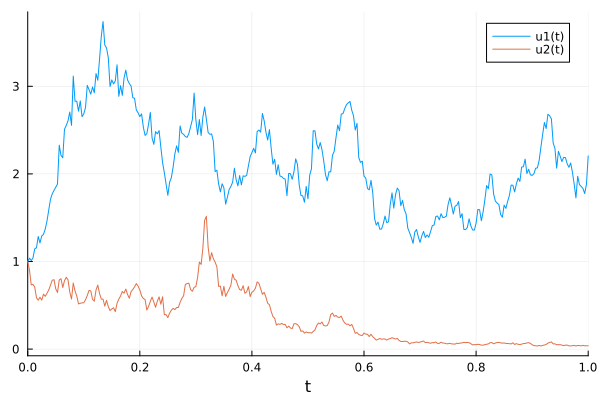

In [323]:
sol = solve(prob,EM(),dt=0.2*dt)
plot(sol)

In [324]:
#Colored Noise

In [325]:
function f(du,u,p,t)
  du[1] = μ*u[1]
  du[2] = κ*(Θ-u[2])
end
function g(du,u,p,t)
  du[1] = √u[2]*u[1]
  du[2] = Θ*√u[2]
end

g (generic function with 2 methods)

In [326]:
ρ=0.2
Γ = [1 ρ;ρ 1]

2×2 Matrix{Float64}:
 1.0  0.2
 0.2  1.0

In [327]:
tspan = (0.0,1.0)
heston_noise = CorrelatedWienerProcess!(Γ,tspan[1],zeros(2),zeros(2))

t: 1-element Vector{Float64}:
 0.0
u: 1-element Vector{Vector{Float64}}:
 [0.0, 0.0]

In [328]:
SDEProblem(f,g,ones(2),tspan,noise=heston_noise)

SDEProblem with uType Vector{Float64} and tType Float64. In-place: true
timespan: (0.0, 1.0)
u0: 2-element Vector{Float64}:
 1.0
 1.0